In [1]:
from DLtools.Data import instant_data,station_sel
from DLtools.feature_sel import *

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pywt
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale

# Loading Data 

In [2]:
###### SETTING AREA ################
loading = instant_data()
df,mode = loading.hourly_instant(),'hour'
# df,mode = loading.daily_instant(),'day'
if mode =='hour': n_past,n_future = 24*7,72
elif mode =='day': n_past,n_future = 60,30

st = 'CPY012'
target,start_p,stop_p,host_path=station_sel(st,mode)


#--------------------------- 4 Yr Edit -----------------------------------#
host_path = './CPY012/4Yr_flood/'
start_p='2014-10-01'
stop_p='2017-10-01'
split_date = '2016-11-01'

save_path = host_path

## Trial 2 yr
#split_date = '2015-06-11'
#stop_p = '2016/02/01'
## Trial 2 yr w/ flood
#start_p = '2016-01-01'
#split_date = '2017-05-10'
#stop_p = '2018-01-01'

<AxesSubplot:xlabel='date'>

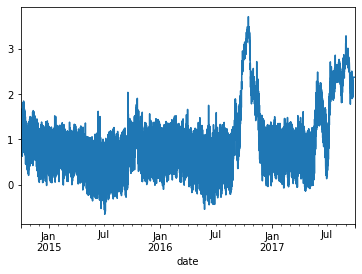

In [3]:
df = df[start_p:stop_p]
data = df

data['Day'] = data.index.dayofyear #add day
data = data.interpolate(limit=300000000,limit_direction='both').astype('float32')#interpolate neighbor first, for rest NA fill with mean() #.apply(lambda x: x.fillna(x.mean()),axis=0)
data[target].plot()


In [4]:
data_mar = call_mar(data,target,mode,cutoff=0.3)

# Check Corr

<AxesSubplot:>

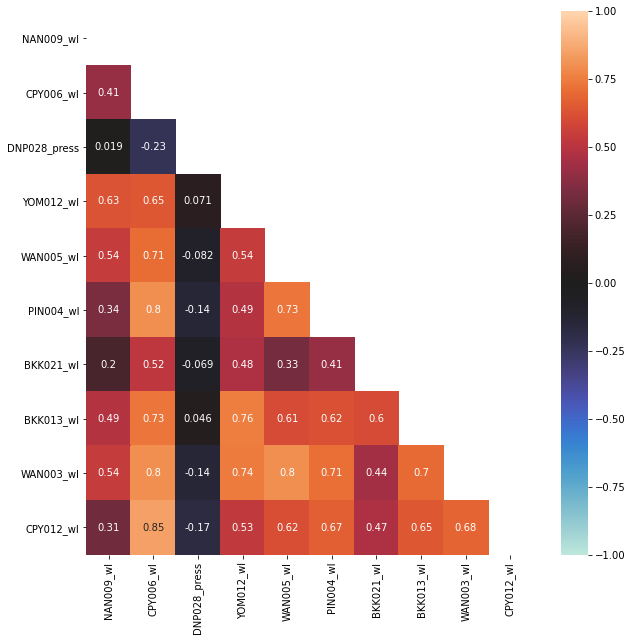

In [5]:
plt.subplots(figsize=(10,10))
mask = np.triu(data_mar.corr())
sns.heatmap(data_mar.corr(), annot = True, vmin=-1, vmax=1, center= 0,mask=mask)

# PCA analysis

In [10]:
# x = data_mar.drop([target],axis=1)
x = scale(data_mar)

covar_matrix = PCA(n_components = x.shape[1])
covar_matrix.fit(x.T)

/home/song/anaconda3/envs/tf/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/song/anaconda3/envs/tf/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:191: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


PCA(n_components=10)

In [22]:
# print(covar_matrix.components_)
# # print(covar_matrix.explained_variance_)


In [11]:
PC_transform = covar_matrix.transform(x.T)
####################
pc_col = []
for i in range (PC_transform.shape[1]):
  pc_col.append('component_'+str(i+1))
#########################
principalDf = pd.DataFrame(data = PC_transform, columns = pc_col)

finalDf = pd.concat([principalDf, pd.Series(data_mar.columns.T)],axis=1)
finalDf.set_index(0).to_csv('MAR/pca_hour_excludeTarget.csv')
finalDf.set_index(0)

,component_1,component_2,component_3,component_4,component_5,component_6,component_7,component_8,component_9,component_10
0,,,,,,,,,,
YOM012_wl,2.452399,50.689610,48.430828,30.233997,60.134666,-11.425057,-32.006584,-31.554962,1.107036,-0.000032
NAN009_wl,37.389027,126.003502,40.952538,-5.804034,-45.321537,40.149033,1.538156,8.877926,-1.494548,0.000191
PIN004_wl,-46.288807,-22.065666,-58.887096,-53.489223,47.032185,55.080612,0.696961,0.088477,-6.164302,-0.000071
CPY006_wl,-65.768318,-31.338625,-14.832406,33.817448,-14.052483,10.132271,-5.212899,6.419821,46.751354,-0.000049
BKK021_wl,3.524609,-89.906036,96.245819,-58.612583,-25.127010,-8.760123,-14.297361,-3.064674,-0.689040,-0.000202
BKK013_wl,-12.343977,-19.577375,47.078854,34.457947,30.405153,-4.591985,68.473228,14.114874,-8.425376,-0.000029
WAN003_wl,-47.649471,37.677109,-24.192677,-12.933952,14.748294,-46.326672,-28.454430,40.957428,-8.065615,0.000016
DNP028_press,216.763321,-34.543312,-46.024326,7.859443,3.420472,-6.132383,-2.773874,3.449050,4.267511,0.000124
WAN005_wl,-36.631798,38.395298,-57.559120,-36.315498,-29.696646,-41.044193,31.772470,-31.080746,1.875544,0.000093


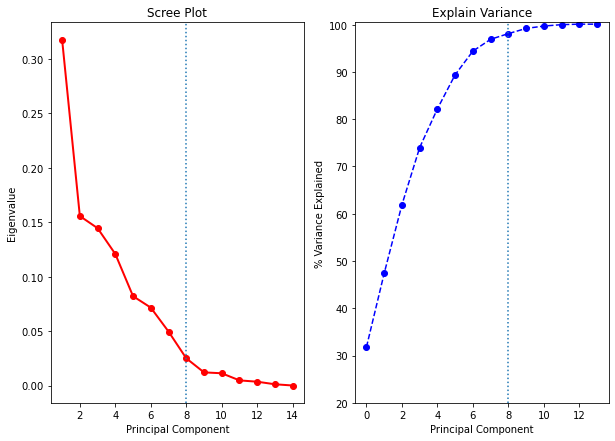

In [36]:
fig,ax = plt.subplots(1,2, figsize=(10,7))
##########################################
PC_values = np.arange(covar_matrix.n_components_) + 1
ax[0].plot(PC_values, covar_matrix.explained_variance_ratio_, 'ro-', linewidth=2)
ax[0].set_title('Scree Plot')
ax[0].set_xlabel('Principal Component')
ax[0].set_ylabel('Eigenvalue')


########################################
variance = covar_matrix.explained_variance_ratio_
var=np.cumsum(np.round(covar_matrix.explained_variance_ratio_, decimals=3)*100)
ax[1].set_ylabel('% Variance Explained')
ax[1].set_xlabel('Principal Component')
ax[1].set_title('Explain Variance')
ax[1].set_ylim(20,100.5)
ax[1].plot(var,'--bo')

#####################################
ax[0].axvline(8,linestyle=':')
ax[1].axvline(8,linestyle=':')
plt.savefig('MAR/PCA_analysis_excludeTarget.png', dpi=300, bbox_inches='tight')

# Actual PCA in ANN


In [6]:
from sklearn.preprocessing import MinMaxScaler,StandardScaler
#scaler_MM = MinMaxScaler()
scaler_Std = StandardScaler()

#df_MMscaled = pd.DataFrame(scaler_MM.fit_transform(data_mar), columns=data_mar.columns,index=data_mar.index)
df_Stdscaled = pd.DataFrame(scaler_Std.fit_transform(data_mar), columns=data_mar.columns,index=data_mar.index)

#train_mm,test_mm = df_MMscaled[:split_date],df_MMscaled[split_date:]
train_std,test_std = df_Stdscaled[:split_date],df_Stdscaled[split_date:]

In [7]:
def pca_check(input,name,line=3):
    covar_matrix = PCA(n_components = input.shape[1])
    covar_matrix.fit(input.T)

    PC_transform = covar_matrix.transform(input.T)
    for i in range(input.shape[1]):
        print("pc{}:{:.3}".format(i+1,covar_matrix.explained_variance_[i]))
    ####################
    pc_col = []
    for i in range (PC_transform.shape[1]):
        pc_col.append('component_'+str(i+1))
    #########################
    principalDf = pd.DataFrame(data = PC_transform, columns = pc_col)

    finalDf = pd.concat([principalDf, pd.Series(input.columns.T)],axis=1)
    finalDf.set_index(0).to_csv(save_path+'PCA_{}.csv'.format(name))
    fig,ax = plt.subplots(1,2, figsize=(10,7))
    
    ##########################################
    PC_values = np.arange(covar_matrix.n_components_) + 1
    ax[0].plot(PC_values, covar_matrix.explained_variance_ratio_, 'ro-', linewidth=2)
    ax[0].set_title('Scree Plot')
    ax[0].set_xlabel('Principal Component')
    ax[0].set_ylabel('Eigenvalue')

    ########################################
    variance = covar_matrix.explained_variance_ratio_
    var=np.cumsum(np.round(covar_matrix.explained_variance_ratio_, decimals=3)*100)
    ax[1].set_ylabel('% Variance Explained')
    ax[1].set_xlabel('Principal Component')
    ax[1].set_title('Explain Variance')
    ax[1].set_ylim(20,100.5)
    ax[1].plot(var,'--bo')

    #####################################
    ax[0].axvline(line,linestyle=':')
    ax[1].axvline(line,linestyle=':')
    plt.savefig('MAR/PCA_{}.png'.format(name), dpi=300, bbox_inches='tight')
    return finalDf.set_index(0)

pc1:6.04e+02
pc2:1.91e+02
pc3:65.0
pc4:53.5
pc5:19.6
pc6:7.27
pc7:5.86
pc8:1.05
pc9:9.96e-12


,component_1,component_2,component_3,component_4,component_5,component_6,component_7,component_8,component_9
0,,,,,,,,,
YOM009_wl,-21.010653,22.806934,-1.119750,-11.656449,-4.092072,1.256077,-0.412260,-0.002095,5.993526e-06
CPY006_wl,-3.637312,12.726285,0.348032,11.955857,-2.045103,-3.340836,-3.265137,0.010060,2.779998e-07
CPY008_wl,26.190962,3.795066,-1.722792,2.384151,-0.460463,0.724638,2.233694,2.243917,-7.887837e-06
CPY011_wl,-10.534131,-8.340724,-5.377825,3.134770,3.707568,5.158828,-3.029655,0.083125,7.797265e-06
NAN006_wl,-3.321671,-16.349707,17.237259,-0.728203,-4.479853,0.757785,-0.233335,-0.010688,9.120908e-06
VLGE15_rain1h,53.820751,0.182677,-1.163482,-5.873437,1.477481,-0.637809,-1.103809,-1.154350,-1.651002e-05
NAN008_wl,-18.720499,4.248653,6.813209,-2.437925,9.623267,-2.076692,1.302889,0.030163,6.096670e-06
CPY010_wl,-5.799832,2.652603,-3.703208,8.217144,-1.781201,1.455015,4.347733,-1.397502,4.480826e-06
CPY012_wl,-16.987621,-21.721790,-11.311439,-4.995907,-1.949622,-3.297007,0.159879,0.197371,1.597730e-05


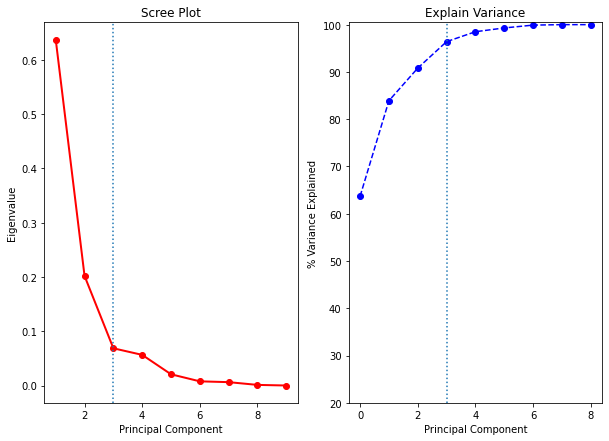

In [26]:
pca_check(df_MMscaled,'MinMax_all')

pc1:5.23e+03
pc2:2.72e+03
pc3:2.19e+03
pc4:1.22e+03
pc5:1e+03
pc6:7.67e+02
pc7:6.57e+02
pc8:3.35e+02
pc9:2.77e+02
pc10:6.72e-11


,component_1,component_2,component_3,component_4,component_5,component_6,component_7,component_8,component_9,component_10
0,,,,,,,,,,
NAN009_wl,30.713467,99.771713,44.419888,31.361300,43.854134,18.280783,-3.182241,7.713119,-1.423714,-0.000013
CPY006_wl,-60.547695,-16.519535,-17.501928,-19.880432,16.323023,7.099345,-13.982511,8.133608,40.770763,0.000008
DNP028_press,188.121994,-20.480360,-45.804661,-10.429983,-0.819049,-4.523267,-2.537817,4.013775,3.543406,-0.000068
YOM012_wl,8.835633,27.636896,57.638779,-47.225178,-26.945652,-8.017015,-25.696243,-29.735418,-1.717411,0.000044
WAN005_wl,-30.486027,40.577759,-46.023819,38.079281,-19.118570,-28.300812,35.612915,-23.202843,7.739903,-0.000018
PIN004_wl,-44.597851,-10.975204,-58.740208,26.029696,-21.161726,46.238819,-31.031651,-5.073291,-14.583559,-0.000011
BKK021_wl,4.344011,-94.848221,66.520157,54.460110,3.413033,-14.300209,-5.910699,-1.425335,-0.143762,0.000046
BKK013_wl,-7.390086,-17.385183,34.051380,-27.664375,-26.373497,38.122681,49.832268,11.906981,-2.860581,-0.000023
WAN003_wl,-40.848652,27.511335,-5.532455,-8.269567,-29.954889,-40.480694,-13.451835,35.077614,-11.263230,0.000053


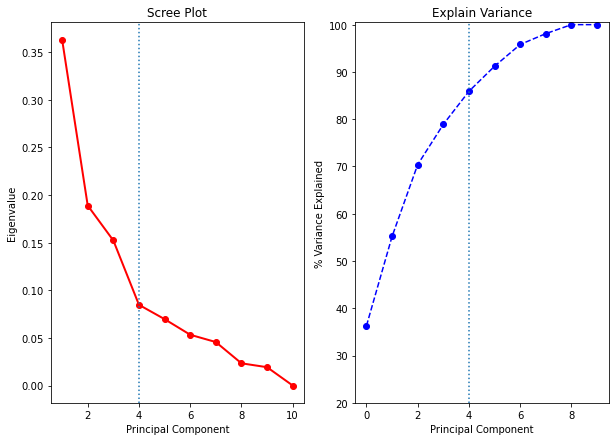

In [8]:
pca_check(df_Stdscaled,'Std_all',4)

pc1:4.75e+03
pc2:2.81e+03
pc3:2.1e+03
pc4:1.07e+03
pc5:8.48e+02
pc6:7.62e+02
pc7:5.89e+02
pc8:3.06e+02
pc9:2.45e+02
pc10:5.85e-11


,component_1,component_2,component_3,component_4,component_5,component_6,component_7,component_8,component_9,component_10
0,,,,,,,,,,
YOM012_wl,-13.300243,65.457169,32.612919,53.017624,13.966678,-30.333462,13.466722,21.152308,6.849628,-0.000014
NAN009_wl,-5.050265,111.331299,-27.997398,-47.648819,10.404696,-2.524292,-23.499683,-5.810506,-1.208792,-0.000002
PIN004_wl,-25.199425,-41.818924,-47.863426,25.602016,-36.887775,-32.038937,-37.885128,-1.639463,-7.735368,0.000033
CPY006_wl,-40.127243,-36.864830,-8.767818,0.315768,20.181715,-4.015744,2.661017,-22.696276,35.179047,-0.000004
BKK021_wl,-17.985182,-25.869045,91.731750,-45.058170,-34.830215,-16.307098,6.106811,3.671801,-0.045007,-0.000015
BKK013_wl,-11.320129,10.401763,46.457569,34.767838,-4.791715,59.428211,-23.612179,-7.305599,-4.772755,0.000027
WAN003_wl,-34.350471,9.427058,-19.947987,9.824296,-3.339078,-3.307354,43.100483,-26.376293,-22.620699,-0.000065
DNP028_press,193.866638,-14.806502,-6.327095,1.512110,0.293274,-1.885177,4.715771,-3.236649,1.664552,0.000076
WAN005_wl,-24.206125,-11.480901,-60.748131,-14.872597,-25.493504,32.782875,23.920044,27.759533,8.566145,0.000004


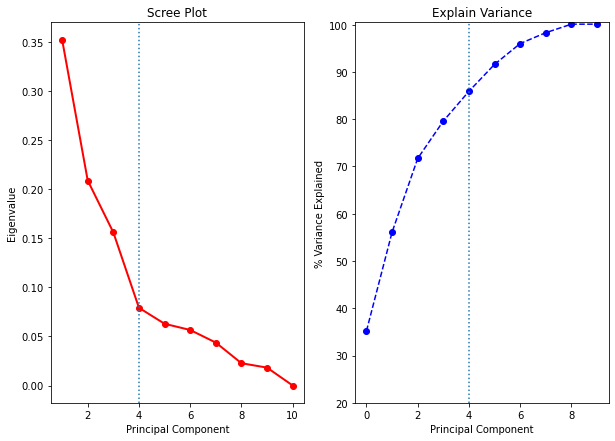

In [20]:
pca_check(train_std,'Std_train',4)

# Check Graph

In [49]:
covar_matrix = PCA(n_components = 3)
covar_matrix.fit(train_mm)


PCA(n_components=3)

In [51]:
PC_transform = covar_matrix.transform(train_mm)
pc_col = []
for i in range (PC_transform.shape[1]):
    pc_col.append('component_'+str(i+1))
#########################
principalDf = pd.DataFrame(data = PC_transform, columns = pc_col)
principalDf


,component_1,component_2,component_3
0,-0.209968,0.097361,-0.047694
1,-0.226360,0.079674,-0.041878
2,-0.243134,0.061257,-0.035450
3,-0.260016,0.041479,-0.029026
4,-0.277421,0.022925,-0.022316
...,...,...,...
25579,-0.091394,0.018889,-0.088840
25580,-0.089074,0.022479,-0.089517
25581,-0.084441,0.027558,-0.089777
25582,-0.083330,0.029708,-0.088576


Text(0.5, 1.0, 'PCA')

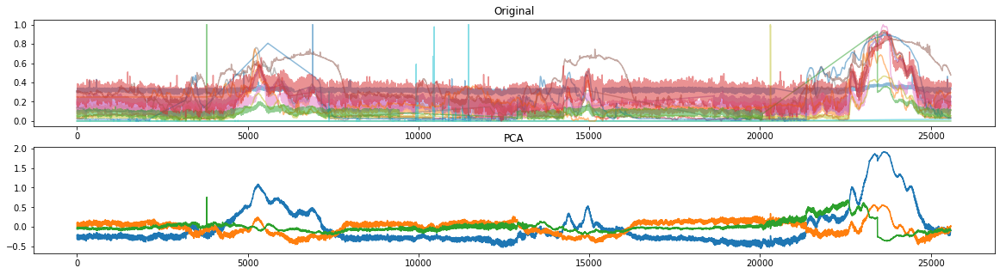

In [67]:
fig,ax = plt.subplots(2,1,figsize=(20,5))

ax[0].set_title('Original')
ax[0].plot(train_mm.values, alpha=0.5)
ax[1].plot(principalDf)
ax[1].set_title('PCA')

Text(0.5, 1.0, 'Train_cD')

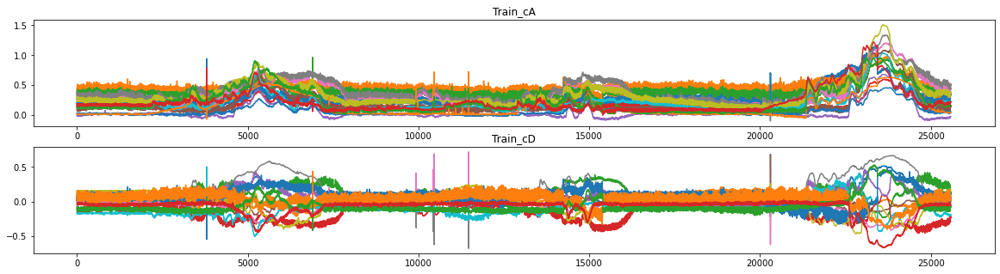

In [74]:
coef = pywt.swt(train_mm,'db4',level=1)
cA,cD = coef[0][0],coef[0][1]
fig,ax = plt.subplots(2,1,figsize=(20,5))
ax[0].plot(cA)
ax[1].plot(cD)
ax[0].set_title('Train_cA')
ax[1].set_title('Train_cD')

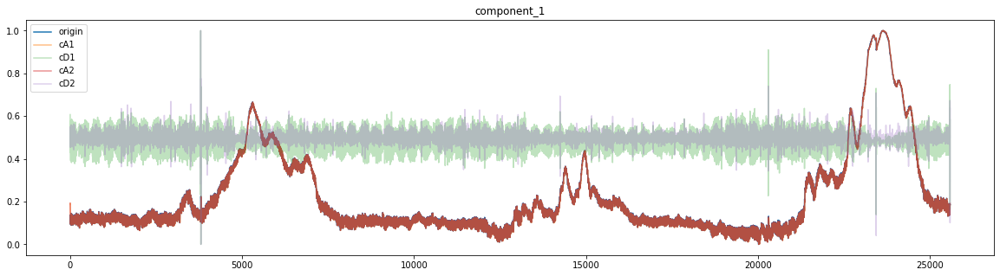

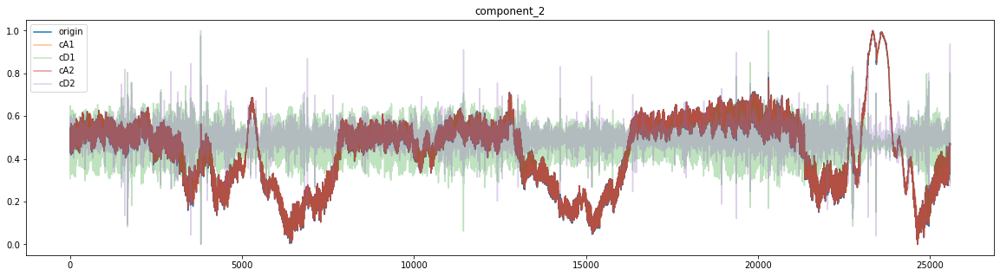

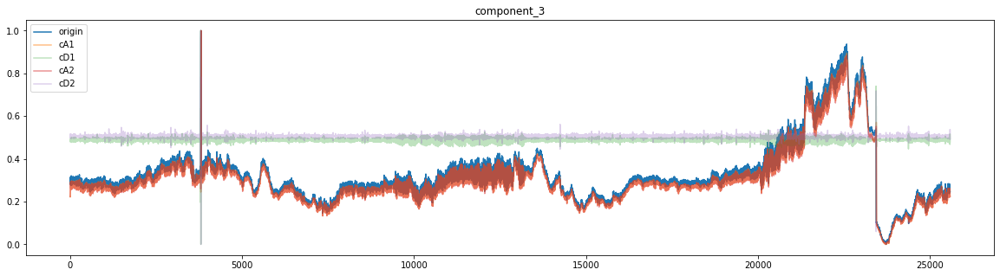

In [103]:
for i in principalDf.columns:
    coef = pywt.swt(principalDf[i],'db4',level=2)
    cA2,cD2,cA1,cD1 = coef[1][0],coef[1][1],coef[0][0],coef[0][1]
    fig,ax = plt.subplots(figsize=(20,5))
    ax.plot(MinMaxScaler().fit_transform(principalDf[i].to_numpy().reshape(-1,1)),label='origin',alpha=1)
    ax.plot(MinMaxScaler().fit_transform(cA1.reshape(-1,1)),label='cA1',alpha=0.5)
    ax.plot(MinMaxScaler().fit_transform(cD1.reshape(-1,1)),label='cD1',alpha=0.3)
    ax.plot(MinMaxScaler().fit_transform(cA2.reshape(-1,1)),label='cA2',alpha=0.5)
    ax.plot(MinMaxScaler().fit_transform(cD2.reshape(-1,1)),label='cD2',alpha=0.3)
    
    ax.set_title(i)
    ax.legend(loc='upper left')

    